<a href="https://colab.research.google.com/github/adrianammborjas/Understanding-consumer-behavior-using-RFM-analysis-and-K-Means-Clustering-Online-Retail-Market/blob/main/Alumni_Database.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Alumni Database KPI Development

The following notebook provides an overview of the data contained in the alumni database of Constructor University (formerly known as Jacobs University Bremen), from the time period 2003 - 2024.

The source dataset was provided by the Alumni Office, hence certain limitations should be noted:
*   Data source is not the official data set from the Registrar Office, hence the data quality is low-medium.
*  Significant pre-processing was conducted and many missing or incomplete values were dropped.

Considering the former, the notebook provides a starting point and snapshot of the development of diversity and transdisciplinary KPIs across years.




In [2]:
# Load libraries
import pandas as pd
from IPython.display import display, HTML
import missingno as msno
import matplotlib.pyplot as plt
import numpy as np

# Provide the file name, make sure it is uploaded on Google Collab, upload file "Alumni Database.xls"
file_name = '/Alumni Database.xls'

# Read the Excel file into a pandas DataFrame
df = pd.read_excel('/Alumni Database.xls')

# Print the DataFrame
#print(df)

# Display the DataFrame as a table
display(HTML(df.to_html()))




,Anrede,First Name,Middle Name,Last Name,Unique Name,LinkedIn,Role,Company,New Name,Nationality,Nationality 2,Class,Year,Program,Degree,Program2,AA Member?,Unnamed: 17,Unnamed: 18
0,NaN,Youssef,NaN,Abdellaoui,YoussefAbdellaoui,NaN,NaN,NaN,NaN,Morocco,NaN,NaN,NaN,NaN,Degree,Program3,AA Member?,NaN,NaN
1,NaN,Zakariae,NaN,Abdellaoui,ZakariaeAbdellaoui,NaN,NaN,NaN,NaN,Morocco,NaN,NaN,NaN,NaN,No Degree,Program4,AA Member?,NaN,NaN
2,NaN,Gonzalo,NaN,Arevalo Iglesias,GonzaloArevalo Iglesias,NaN,NaN,NaN,NaN,Spain,NaN,phd,24,BIGSSS,Doctor of Philosophy,Program5,AA Member?,NaN,NaN
3,NaN,Chaimae,NaN,Chbani,ChaimaeChbani,NaN,NaN,NaN,NaN,Morocco,NaN,NaN,NaN,NaN,No Degree,Program6,AA Member?,NaN,NaN
4,NaN,Catalina,Belén,Ganga León,CatalinaBelénGanga León,NaN,NaN,NaN,NaN,Chile,NaN,phd,24,BIGSSS,Doctor of Philosophy,Program7,AA Member?,NaN,NaN
5,NaN,Risako,NaN,Gen,RisakoGen,NaN,NaN,NaN,NaN,Japan,NaN,ug,EX,EXC,Bachelor of Science,Program8,AA Member?,NaN,NaN
6,NaN,Nuguse,Bahre,Goitom,NuguseBahreGoitom,NaN,NaN,NaN,NaN,Eritrea,NaN,NaN,NaN,NaN,No Degree,Program9,AA Member?,NaN,NaN
7,NaN,Mikhail,NaN,Hlushchanka,MikhailHlushchanka,NaN,NaN,NaN,NaN,Belarus,NaN,phd,16,MATH (I),Doctor of Philosophy,Program10,AA Member?,NaN,NaN
8,NaN,Gamze,NaN,IPEK,GamzeIPEK,NaN,NaN,NaN,NaN,Turkey,NaN,NaN,NaN,NaN,NaN,Program11,AA Member?,NaN,NaN
9,NaN,Pay Laurin,NaN,Jessen,Pay LaurinJessen,NaN,NaN,NaN,NaN,Germany,NaN,phd,24,BIGSSS,Doctor of Philosophy,Program12,AA Member?,NaN,NaN


**Data Exploration**

We explore the number of missing values. Since we are interested in learning more about the development of programs and nationality across years, we need to ensure we are working with a clean data set.

In [3]:
# Count missing values per column
missing_values = df.isnull().sum()

# Compute the total number of values per column
total_values = df.count()

# Create a DataFrame to store the statistics
statistics = pd.DataFrame({'Missing Values': missing_values, 'Total Values': total_values})

# Print the statistics
print(statistics)

               Missing Values  Total Values
Anrede                     25          9301
First Name                  6          9320
Middle Name              5967          3359
Last Name                   6          9320
Unique Name                 5          9321
LinkedIn                 9252            74
Role                     9254            72
Company                  9254            72
New Name                 9325             1
Nationality               196          9130
Nationality 2            8806           520
Class                     395          8931
Year                      609          8717
Program                   475          8851
Degree                    125          9201
Program2                  373          8953
AA Member?                  6          9320
Unnamed: 17              9326             0
Unnamed: 18              9323             3


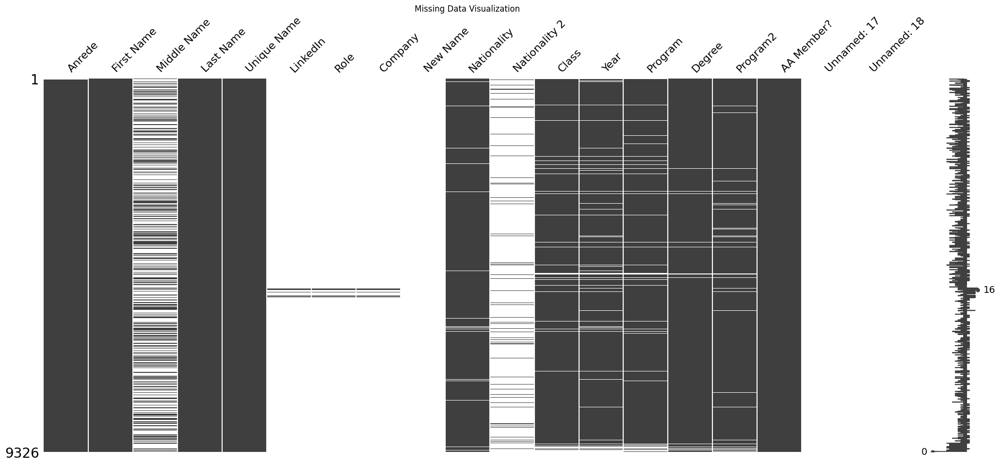

In [4]:
# Visualize missing values
msno.matrix(df)

# Middle Name, LinkedIn, Role, Company, New Name, and Nationality 2 are predominately with missing as the database values need to be added.

# Set plot properties
plt.title('Missing Data Visualization')
plt.show()

# Transdisciplinarity KPI

We define "transdisciplinarity" as the level of academic diversity across programs and schools.

Majors at Constructor University have changed their name across time. Hence the best way to ensure a comprehensive comparison is clustering majors into the three new schools developed at Constructor University: STEM, SOC, BIZ, consisting of the following focus areas:

> **STEM:** Science, technology, engineering and math.

>**SOC:** Social Sciences

> **BIZ:** Business

To explore the level of transdisciplinarity, we take as a reference the "Program" column comprised of all majors and "Year".


In [5]:
# Data Exploration: Transdisciplinarity

# Check missing values in the "program" column
missing_values = df['Program'].isnull().sum()
print("Missing Values in 'program' column:", missing_values)

# Count the number of unique values in the "program" column
unique_count = df['Program'].nunique()
print("Number of Unique Values in 'program' column:", unique_count)

# Get the unique values in the "program" column
unique_values = df['Program'].unique()
print("Unique Values in 'Program' column:")
for value in unique_values:
    print(value)

# Create a DataFrame to store the results
results = pd.DataFrame({'Metric': ['Missing Values', 'Unique Values Count', 'Unique Values'],
                        'Value': [missing_values, unique_count, ', '.join(map(str, unique_values))]})

# Print the results
print(results)

Missing Values in 'program' column: 475
Number of Unique Values in 'program' column: 204
Unique Values in 'Program' column:
nan
BIGSSS
EXC
MATH (I)
WS
iSS-IC
IPH
EUM
IR
CBT
EES
BCE
CPS
CHEM
GEM
IEM
Foundation Year
CS
MSc
BIOCHEM
PHD
BPSD
IMS
ECE
EECS
MICROBIO
BSc
BIOTECH
ACM
MOLIFE
MATH
BIO
EE
ISCP
BCCB
PHY
ISS
MCCB
IRPH
MoLife
IL
IBA
CS (SMART SYST)
SCM
PSY
DE
ILME
DSSB
COMPLIFE
CS (SMART)
LKI
SCEM
SMP
PHYSCS
BIOREC (BC)
ASTRo
ISCP, ISS
PAD
GEOASTRO
GEO
Geo-Ocean Dynamics
ESS
EECS, MATH
IH
NANO
H
CS (SMART SYS)
CS, IMS
H, ISS
ESSReS
IRB
RIS
SCHAEFFLER
MEDNAT
IES
HTAL
BA
NEURO(JCLL)
BAIC
NANO (CHEM)
SOCI
BIGSSS (AFF)
BIO, ISCP
Geosciences
MGH
Exchange/Visiting Program
 BIOINF
ISS-CPS
Guest
INTLOG
NANO FastTrack
ISS (POL)
ECE, IES
CS, MATH
PSYCH
CELLBIO
ESS & GEM
ECON
ASTRO
MGMT
ISS (SOC)
BICB
BCCB, ISS
WEICHAI
GEM, ECE
ICS
HUMAN
GEM, IEM
COMPBIO
CPN
ISS (ECON)
BCCB, CHEM
BCCB, ESS
BCCB, BIO
PSY (SHSS)
PHYS
PHY, CS
BIOREC
BIOINF
NANO (PHY)
BUSADMIN
CS (I)
COSYP (I)
ISS, ISCP
NANO (I)
BU

CS                                 608
BCCB                               487
EXC                                475
ISS                                416
IR                                 339
IEM                                316
GEM                                282
PHY                                279
ECE                                261
CHEM                               239
EECS                               222
IPH                                212
MATH                               212
ISCP                               199
IBA                                181
DE                                 179
IRPH                               165
BIGSSS                             159
BCE                                158
Foundation Year                    155
EE                                 146
PSY                                138
IL                                 120
SCEM                               114
ILME                               110
WS                       

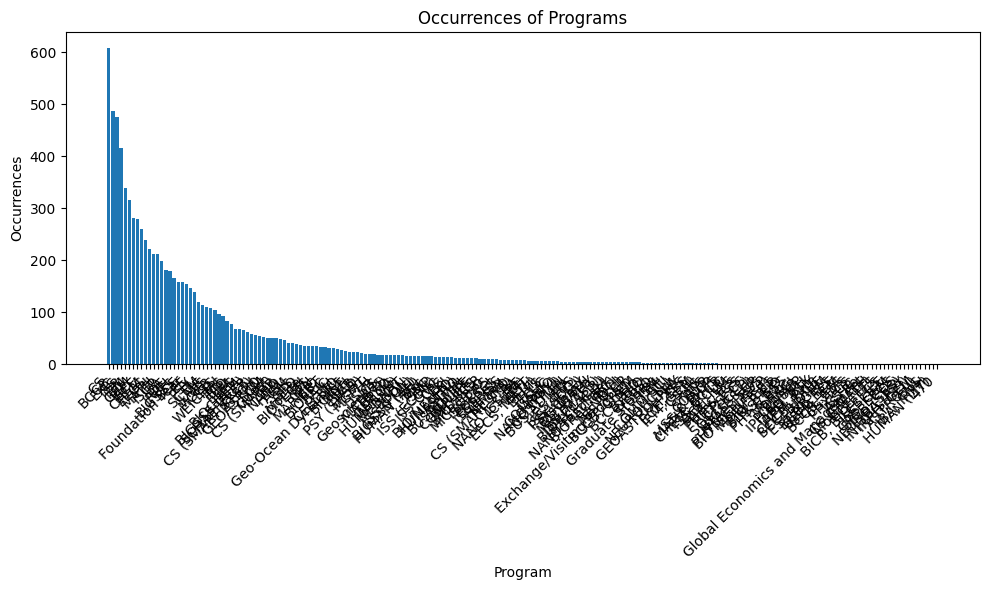

In [6]:
# Understanding the occurrences of "Program"

# Set pandas display options to show all rows
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
np.set_printoptions(threshold=np.inf)

# Assuming you have already loaded your DataFrame 'df' from your dataset

# Count the occurrences of each unique value in the "program" column
value_counts = df['Program'].value_counts()

# Print the value counts
print(value_counts)

# Plotting the occurrences as a bar plot
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(value_counts.index.astype(str), value_counts.values)
plt.xlabel('Program')
plt.ylabel('Occurrences')
plt.title('Occurrences of Programs')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Clustering majors into schools**

Before calculating the transdisciplinarity score, an important step, consisting of clustering the majors into schools needs to be conducted.

Limitation: Clustering was made on the basis of personal judgment as there is no official list where the major acronyms are defined. Some values need to be double checked as already noted on the mapping.

In [7]:
# Defining the mapping of majors to school groups, always check
major_to_school = {
    'CS': 'stem',
    'BCCB': 'stem',
    'EXC': 'biz',
    'ISS': 'soc',
    'IR': 'soc',
    'IEM': 'biz',
    'GEM': 'biz',
    'PHY': 'stem',
    'ECE': 'stem',
    'CHEM': 'stem',
    'EECS': 'stem',
    'OCB': 'stem', ##DOUBLE CHECK
    'IPH': 'soc',
    'MATH': 'stem',
    'ISCP': 'soc',
    'IBA': 'biz',
    'DE': 'stem',
    'IRPH': 'soc',
    'BIGSSS': 'soc',
    'BCE': 'biz', ## DOUBLE CHECK
    'Foundation Year': 'stem', #DEFINE HOW - DUPLICATES BE CAREFUL
    'EE': 'stem',
    'PSY': 'soc',
    'IL': 'soc', #DOUBLE CHECK
    'SCEM': 'biz', #DOUBLE CHECK
    'ILME': 'stem', #DOUBLE CHECK
    'WS': 'stem', #CHECK
    'MCCB': 'stem',
    'EES': 'stem',
    'WEICHAI': 'soc',#CHECK
    'IMS': 'biz',#CHECK
    'BIO': 'stem',
    'EUM': 'stem', #CHECK
    'EES': 'stem',
    'BIOCHEM': 'stem',
    'BIGSSS (AFF)': 'soc',
    'SCHAEFFLER': 'biz',
    'CS (SMART SYST)': 'stem',
    'PSYCH': 'soc',
    'GEOASTRO': 'stem',
    'SCM': 'biz',
    'GUEST': 'soc', #CHECK
    'CS (SMART)': 'stem',
    'IRB': 'stem', #CHECK, I THINK IT IS ROBOTICS
    'NANO': 'stem', #CHECK AGAIN
    'HTAL': 'stem', #CHECK
    'ACM': 'stem', #CHECK
    'RIS': 'stem', #CHECK ROBOTICS?
    'GEO': 'stem',
    'MoLife': 'stem', #CHECK, MOLECULAR LIFE?
    'BIOTECH': 'stem',
    'IES': 'stem', #check
    'CPN': 'stem',#check
    'MARMIC': 'soc',#check
    'CBT': 'stem',
    'BIOREC': 'stem', #CHECK
    'BAIC': 'stem',#CHECK
    'IH': 'soc', #INTERNATIONAL ?
    'CELLBIO': 'stem',
    'Geo-Ocean Dynamics': 'stem',
    'BIOINF': 'stem',
    'MGH': 'stem', #CHECK
    'BICB': 'stem',#
    'PAD': 'stem',#
    'PSY (SHSS)': 'soc',
    'MGMT': 'biz',#
    'H': 'biz',
    'DSSB': 'stem',
    'ICS': 'stem',
    'Geosciences': 'stem',
    'MATH (I)': 'stem',
    'BPSD': 'biz',
    'INTLOG': 'stem',
    'HUMAN (H)': 'soc',
    'MEDNAT': 'biz',
    'ECON': 'stem',
    'ISS (POL)': 'stem',
    'BIGSSS (AF)': 'stem',
    'HUMAN (AH)': 'stem',
    'BSc': 'soc',
    'MSc': 'biz',
    'SMP': 'stem',
    'ISS (ECON)': 'stem',
    'ISS-GVC': 'stem',
    'CPS': 'stem',
    'LKI': 'soc',
    'BIO/NEURO': 'biz',
    'HUMAN (L)': 'stem',
    'ASTRO': 'stem',
    'BUSADMIN': 'stem',
    'MOLIFE': 'stem',
    'COMPLIFE': 'biz',
    'PHYSCS': 'stem',
    'BIO, ISCP': 'biz',
    'MICROBIO': 'stem',
    'ISS-CPS': 'stem',
    'POLSCI': 'stem',
    'ESSReS': 'stem',
    'ISCP, ISS': 'soc',
    'HUMAN': 'biz',
    'NEURO': 'stem',
    'CS (SMART SYS)': 'stem',
    'BA': 'stem',
    'ISS-IPE': 'stem',
    'NANO (CHEM)': 'soc',
    'EECS, MATH': 'soc',
    'EE (I)': 'biz',
    'PHYS': 'stem',
    'CLC': 'stem',
    'ISS-IC': 'stem',
    'COMPBIO': 'stem',
    'NANO (PHY)': 'soc',
    'COSYP (I)':'soc',
    'BUS ADMIN': 'stem',
    'HTA': 'biz',
    'IES, ESS': 'stem',
    'ISS (SOC)': 'stem',
    'PSY (JCLL)': 'stem',
    'VisComX': 'stem',
    'CS, MATH': 'soc',
    'MATH, PHY': 'biz',
    'BIOREC (CB)': 'stem',
    'PSY ( JCLL)': 'stem',
    'NANO FastTrack': 'stem',
    'BIOREC (BC)': 'stem',
    'SOCI': 'soc',
    'NANO (I)': 'biz',
    'ISS, ISCP': 'stem',
    'Exchange/Visiting Program': 'stem',
    'BCCB, CHEM': 'stem',
    'PHD': 'stem',
    'BCCB, BIO': 'stem',
    'DECSI': 'stem',
    'SYSBIO': 'stem',
    'Graduate Studies': 'stem',
    'ISM': 'soc',
    'GH': 'biz',
    'COMM SCI': 'stem',
    'NEURO(JCLL)': 'stem',
    'LNM': 'stem',
    'GEOASTRO, PHY': 'stem',
    'H, ISS': 'soc',
    'ECE, ESS': 'soc',
    'IEM, GEM': 'biz',
    'CS (I)': 'stem',
    'HIS': 'stem',
    'STATS': 'stem',
    'COSYP': 'stem',
    'ISS & ISCP': 'soc',
    'MATH, PHYS': 'biz',
    'CHEM, BCCB': 'stem',
    'ISS & CLC': 'stem',
    'BCE, ILM': 'stem',
    'HTAL, ISS': 'stem',
    'PHY & ICS': 'stem',
    'PHY & ESS': 'stem',
    'CPS, CS': 'stem',
    'SOCI (JCLL)': 'stem',
    'BIGSSS (I)': 'soc',
    'HTAL, ISCP': 'biz',
    'PHYSICS, ESS': 'stem',
    'BIOTECH ISCP': 'stem',
    'MOLIFE (I)': 'stem',
    'PHY, EES': 'stem',
    'BIO, BICB': 'soc',
    'ISS, BIO': 'soc',
    'PHY & ESS': 'soc',
    'MarMic': 'biz',
    'DESCI': 'stem',
    'POLMAR': 'stem',
    'IPH & ISCP': 'stem',
    'IRB, IPH': 'stem',
    'IRPH, PSY': 'soc',
    'CHEM, PHY': 'biz',
    'BCCB, BICB': 'stem',
    ' BIOINF': 'stem',
    'ESS & GEM': 'stem',
    'BCCB, ISS': 'stem',
    'GEM, ECE': 'stem',
    'GEM, IEM': 'stem',
    'BCCB, ESS': 'stem',
    'CS, IMS': 'stem',
    'PHY, CS': 'soc',
    'iSS-IC': 'biz',
    'ASTRo': 'stem',
    'Global Economics and Management': 'stem',
    'CS & Math': 'stem',
    'MoLife (FT)': 'stem',
    'ECE, IES': 'soc',
    'BICB, BIO,EECS': 'stem',
    'CS, ILE': 'stem',
    'ISS, GEM': 'stem',
    'CPS, EECS': 'stem',
    'BICB, COS': 'stem',
    'NEURO (SES)': 'soc',
    'IBA, PSY': 'biz',
    'INFO (SHSS)': 'stem',
    'IRPH, GEM': 'stem',
    'ASTRO (I)': 'stem',
    'CNS': 'stem',
    'IBA, IRPH': 'soc',
    'HUMAN (LIT)': 'soc',
   }

#Map the majors to school groups and create the "school" column
df['School'] = df['Program'].map(major_to_school)

# Count the unique values in the "school" column
school_counts = df['School'].value_counts()

# Print the counts of unique values
print(school_counts)




stem    4665
soc     2145
biz     1881
Name: School, dtype: int64


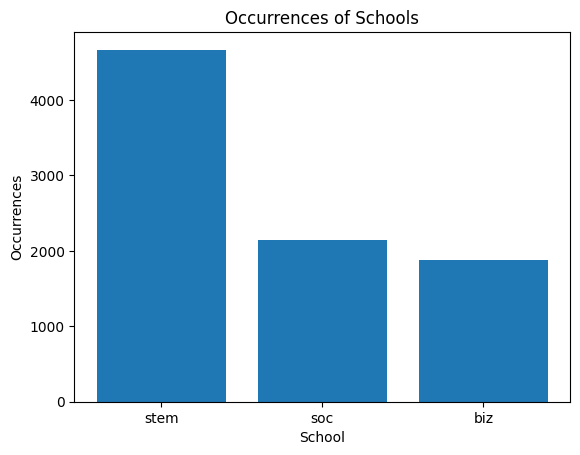

In [8]:
# Visualize school clustering results

# Filter the school_counts to only include "stem", "biz", and "soc"
filtered_counts = school_counts[school_counts.index.isin(['stem', 'biz', 'soc'])]

# Plotting the occurrences as a bar plot
plt.bar(filtered_counts.index, filtered_counts.values)
plt.xlabel('School')
plt.ylabel('Occurrences')
plt.title('Occurrences of Schools')
plt.show()

In the "Year" column we drop values which do not correspond to the academic years we are interested in exploring.

In [9]:
# Convert the "Year" column to a formatted year string - IMPORTANT STEP!
df['Year'] = df['Year'].apply(lambda x: f'20{int(x):02d}' if pd.notnull(x) and isinstance(x, (int, float)) else x)

# List of values to drop from the "Year" column
values_to_drop = ["EX", "Exchange/Visiting Program", "Fall 10", "I", "II", "Fall 17", "Fall 18", "Fall 19", "Fall 20", "Spring 17", "Spring 21", "20604", "nan"]

# Remove rows with specified values from the "Year" column
df_cleaned = df[~df['Year'].isin(values_to_drop)]

# Display the first 10 rows with "Year" and "Program" columns
print(df_cleaned.loc[:, ["Year", "Program"]].head(10))

    Year   Program
0    NaN       NaN
1    NaN       NaN
2   2024    BIGSSS
3    NaN       NaN
4   2024    BIGSSS
6    NaN       NaN
7   2016  MATH (I)
8    NaN       NaN
9   2024    BIGSSS
10  2024    BIGSSS


In [10]:
print(df_cleaned.head(10))

   Anrede  First Name Middle Name         Last Name              Unique Name  \
0     NaN     Youssef         NaN        Abdellaoui        YoussefAbdellaoui   
1     NaN    Zakariae         NaN        Abdellaoui       ZakariaeAbdellaoui   
2     NaN     Gonzalo         NaN  Arevalo Iglesias  GonzaloArevalo Iglesias   
3     NaN     Chaimae         NaN            Chbani            ChaimaeChbani   
4     NaN    Catalina       Belén        Ganga León  CatalinaBelénGanga León   
6     NaN      Nuguse       Bahre            Goitom        NuguseBahreGoitom   
7     NaN     Mikhail         NaN       Hlushchanka       MikhailHlushchanka   
8     NaN       Gamze         NaN              IPEK                GamzeIPEK   
9     NaN  Pay Laurin         NaN            Jessen         Pay LaurinJessen   
10    NaN       Tanya         NaN              Keni                TanyaKeni   

   LinkedIn Role Company New Name Nationality Nationality 2 Class  Year  \
0       NaN  NaN     NaN      NaN     Morocc

In [11]:
# Group the data by year and school, and count the occurrences
school_counts_per_year = df_cleaned.groupby(['Year', 'School']).size().reset_index(name='count')

# Print the counts per year of each school
print(school_counts_per_year)


    Year School  count
0   2003   stem      2
1   2004    biz      6
2   2004    soc     44
3   2004   stem     61
4   2005    biz     22
5   2005    soc     84
6   2005   stem    131
7   2006    biz      8
8   2006    soc     92
9   2006   stem    156
10  2007    biz     28
11  2007    soc     99
12  2007   stem    196
13  2008    biz      9
14  2008    soc     87
15  2008   stem    204
16  2009    biz     13
17  2009    soc    100
18  2009   stem    238
19  2010    biz     26
20  2010    soc    138
21  2010   stem    270
22  2011    biz     32
23  2011    soc    131
24  2011   stem    249
25  2012    biz     41
26  2012    soc    131
27  2012   stem    188
28  2013    biz     52
29  2013    soc    120
30  2013   stem    186
31  2014    biz     53
32  2014    soc     84
33  2014   stem    277
34  2015    biz     39
35  2015    soc     79
36  2015   stem    265
37  2016    biz     44
38  2016    soc     83
39  2016   stem    228
40  2017    biz     50
41  2017    soc     87
42  2017   

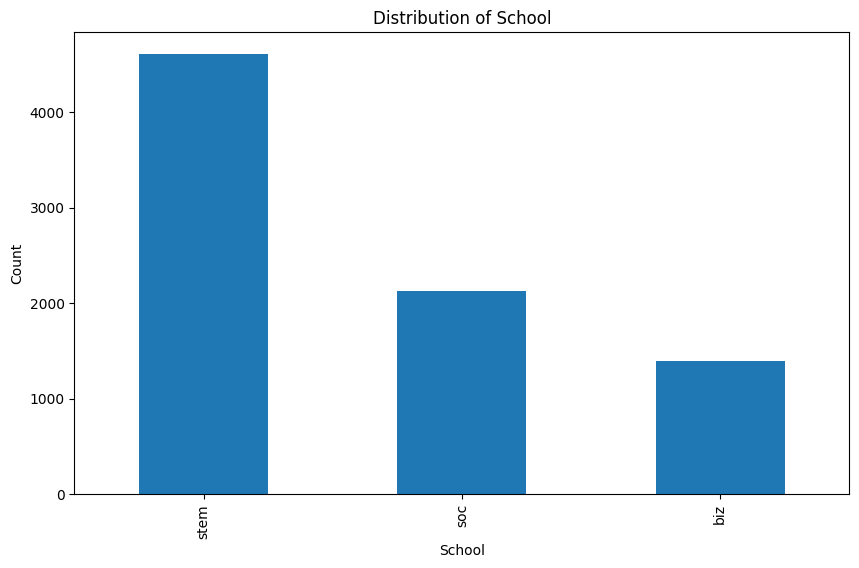

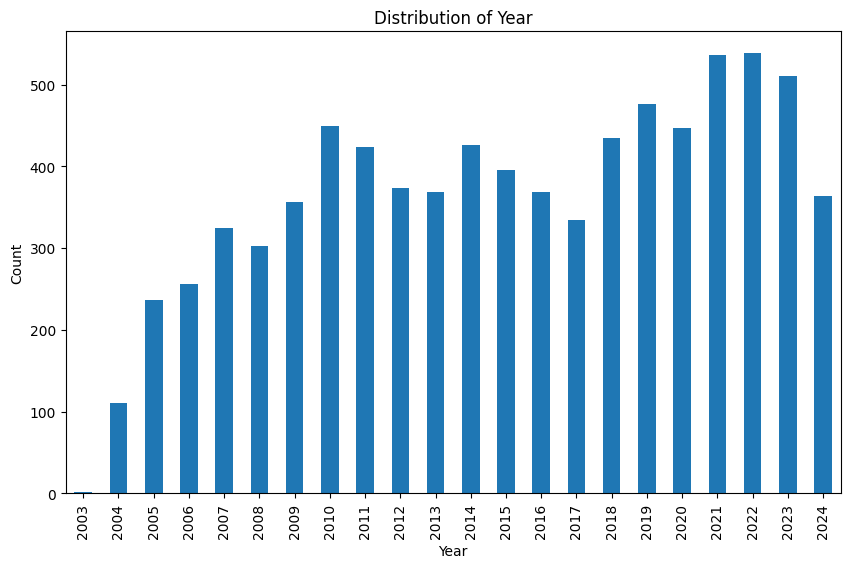

In [12]:
# Plot the distribution of the "school" column
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
df_cleaned['School'].value_counts().plot(kind='bar')
plt.title('Distribution of School')
plt.xlabel('School')
plt.ylabel('Count')
plt.show()

# Plot the distribution of the "year" column
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
df_cleaned['Year'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()


The STEM school is the most predominant if compared against the BIZ and SOC schools as observed on the graph below. Additionally, the number of students per year fluctuates.

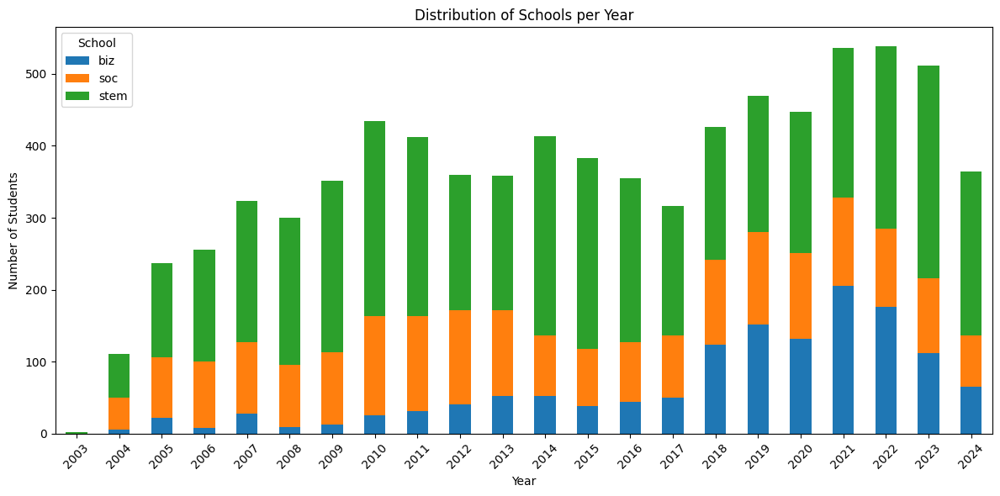

In [13]:
# Group the DataFrame by "Year" and "School" columns and get the count
school_year_counts = df_cleaned.groupby(['Year', 'School']).size().unstack()

# Plot the distributions as a stacked bar graph
school_year_counts.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.title('Distribution of Schools per Year')
plt.legend(title='School')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The following code and visuals can be used as a further reference for additional visuals that you can draft from the data set.

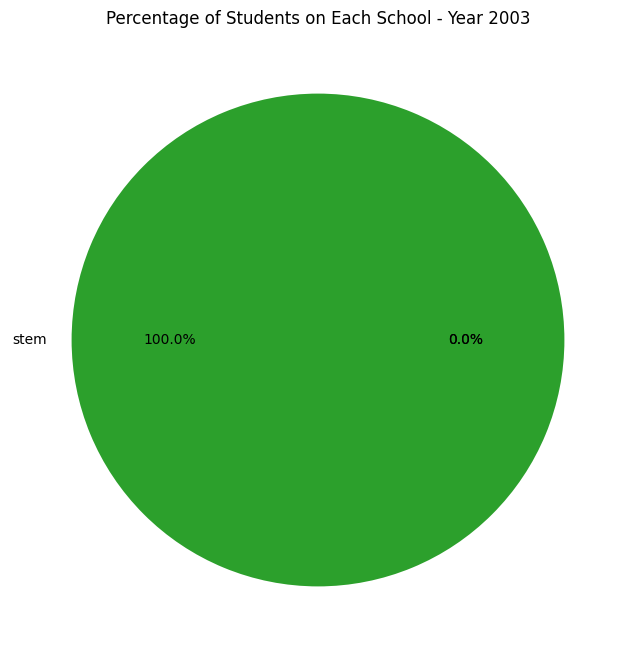

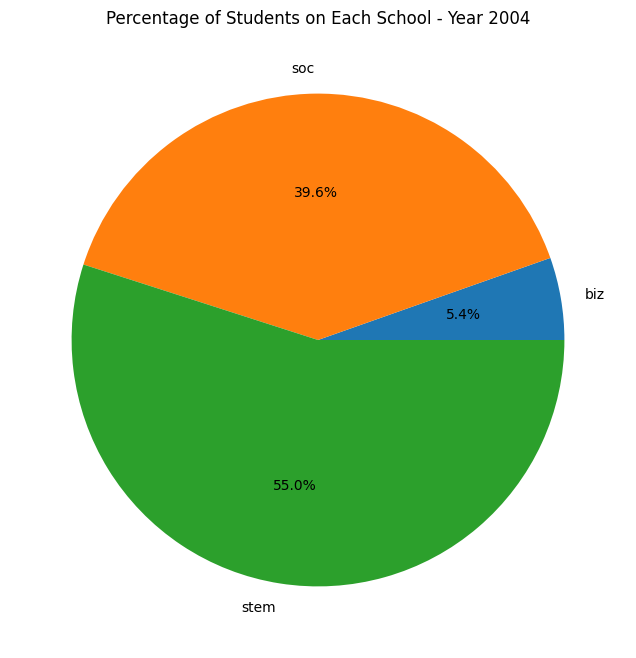

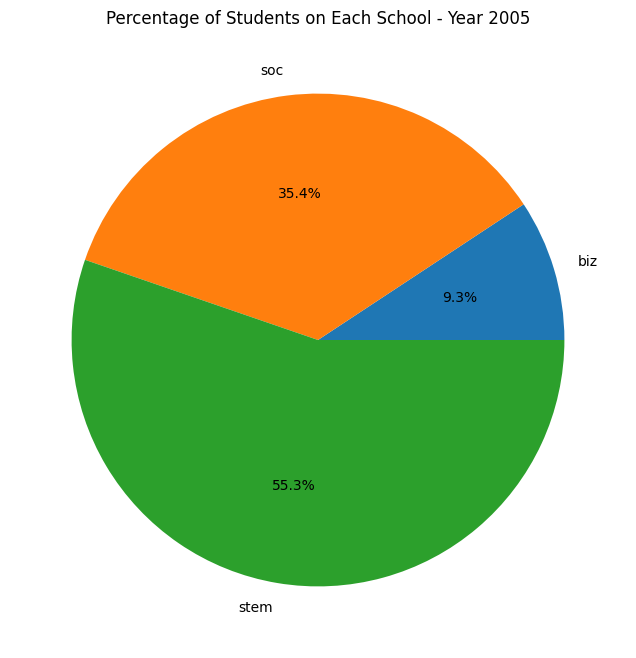

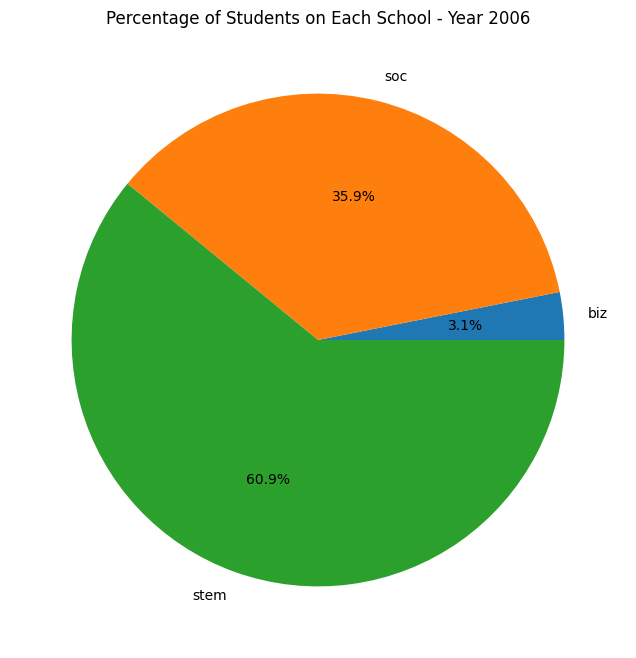

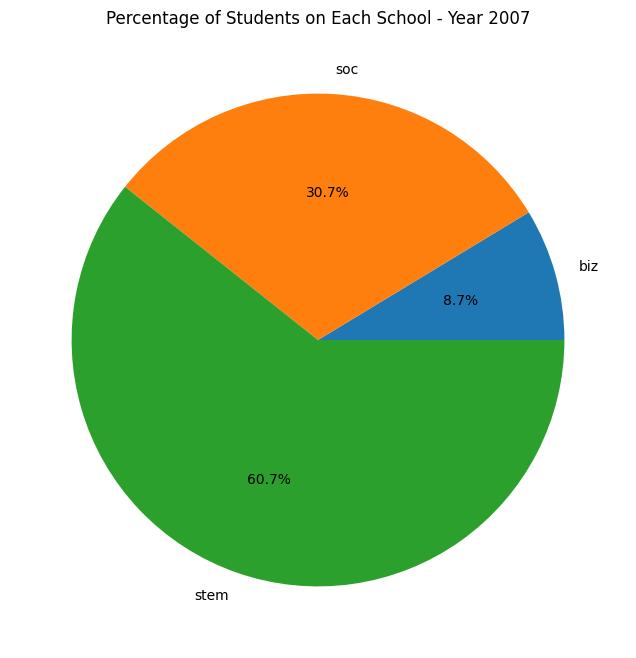

...

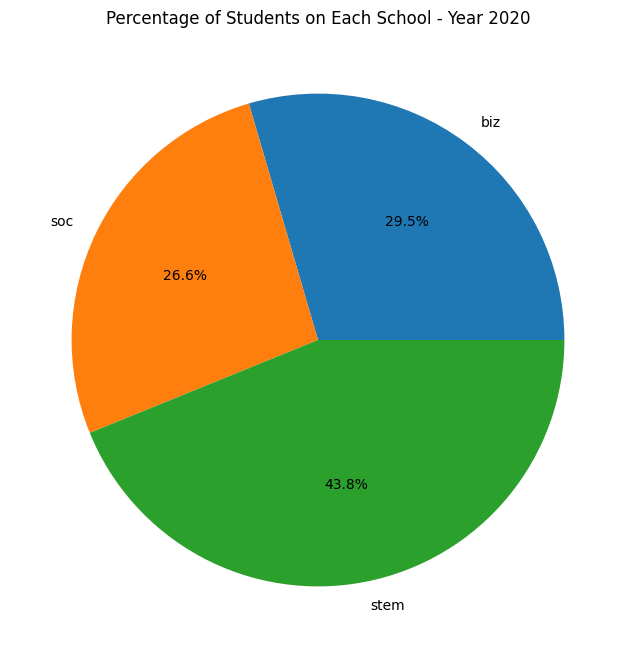

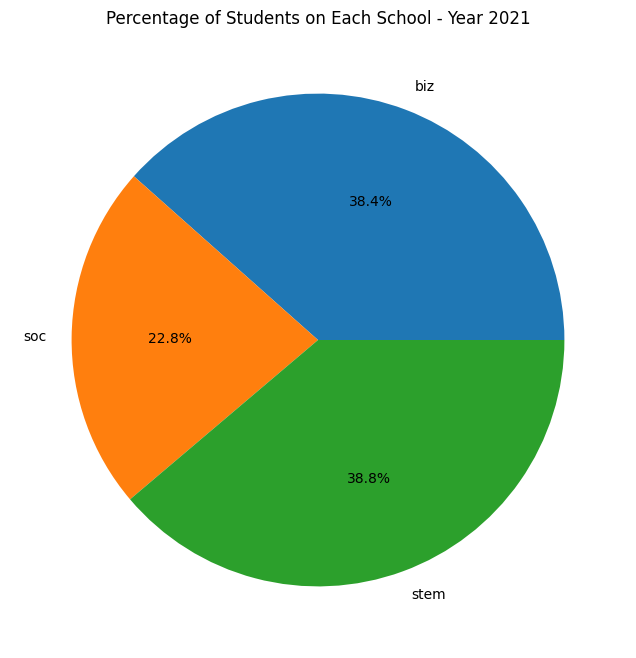

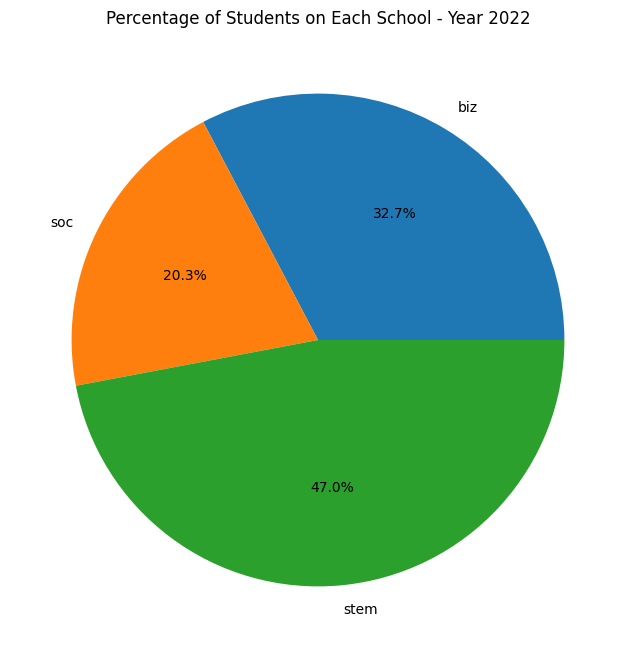

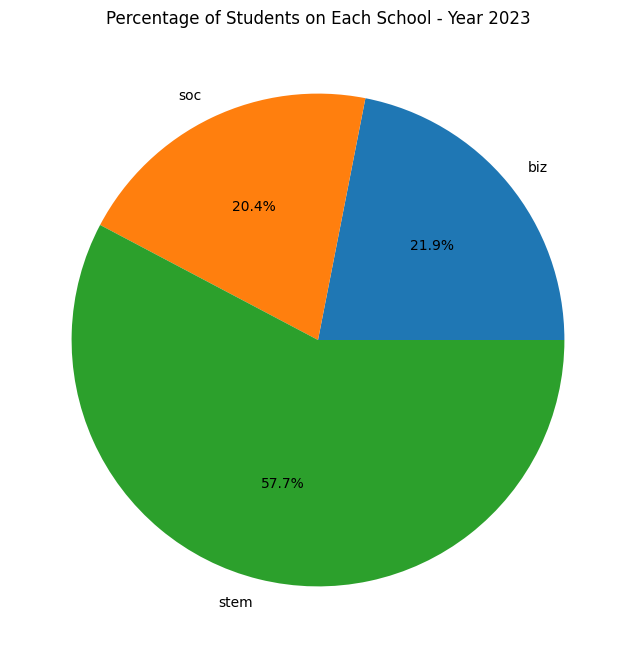

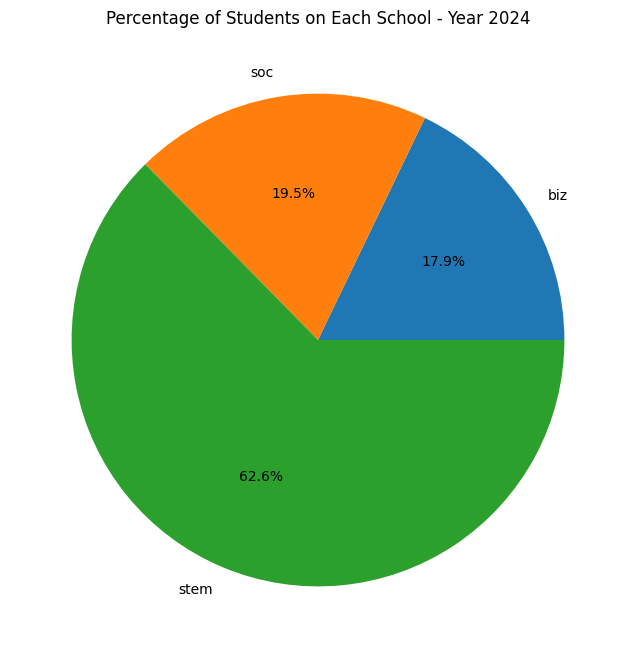

In [14]:
# Group the data by year and school, and count the occurrences
school_counts_per_year = df_cleaned.groupby(['Year', 'School']).size().unstack(fill_value=0)

# Calculate the percentage of students per school for each year
school_percentages_per_year = school_counts_per_year.apply(lambda x: x / x.sum() * 100, axis=1)

# Plot the percentage of students on each school per year using pie charts
for year, data in school_percentages_per_year.iterrows():
    plt.figure(figsize=(8, 8))  # Optional: Adjust the figure size
    data.plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Percentage of Students on Each School - Year {year}')
    plt.ylabel('')  # Optional: Remove the ylabel
    plt.show()

**Transdisciplinarity Score**

A transdisciplinarity score closer to 1 indicates a more even distribution of students across the different academic schools (STEM, BIZ, SOC) for that year.


A transdisciplinarity score closer to 0 indicates a more uneven distribution of students, with one or more schools having a higher concentration of students compared to others.


Steps for calculating transdisciplinarity score:

**1.   Get Observed Distribution:**


*   For each year in the dataset, we first filter the data to include only the entries for that specific year.
*   Consequently we calculate the observed distribution of schools for that year. This distribution indicates the proportion of students in each school category (stem, biz, soc) for that year. This is calculated using the value_counts(normalize=True) function, which provides the proportion of each unique value (school) in the filtered data.

**2.   Calculate Expected Distribution:**


*   We calculate the expected distribution by assuming that in a perfectly balanced scenario, each school should have an equal proportion of students (1/n for n schools). Here, n represents the number of unique schools in our dataset (3).


**3. Calculate Absolute Difference:**


*   Consequently, we calculate the absolute difference between the observed distribution and the expected distribution for each school. This gives us an idea of how far each school's distribution is from the ideal equal distribution.

**4. Sum of Absolute Differences:**

*   We sum up the absolute differences calculated in the previous step. This is a measure of how much the distribution of students deviates from the ideal balanced distribution.

**5. Transdisciplinarity Score Calculation:**



*   We divide the sum of absolute differences by the number of unique schools (n) minus one (n-1). This normalization factor accounts for the fact that if we have only one school, there's no deviation from the ideal distribution.
*   The result of this calculation is the transdisciplinarity score for that specific year. This score measures the extent of deviation of school distribution from the ideal balanced distribution, scaled between 0 and 1.
*   A score of 0 indicates a perfectly balanced distribution (ideal scenario), while a score closer to 1 indicates a greater deviation from the ideal distribution.

**6. Storing the Scores:**

*   We store the results in the data frame.


Overall, this formula quantifies how balanced or transdisciplinary the distribution of students is among the three schools (stem, biz, soc) for each year. The lower the score, the closer the distribution is to an equal representation of students across all schools, which aligns with the goal of transdisciplinarity. For detailed steps, please see the code below.










In [37]:
# Get the unique years in the dataset
years = df_cleaned['Year'].unique()

# Initialize an empty list to store the scores
scores = []

# Iterate over each year and calculate the transdisciplinarity score
for year in years:
    # Filter the data for the specific year
    year_data = df_cleaned[df_cleaned['Year'] == year]

    # Get the observed distribution for the schools in the specific year
    observed_distribution = year_data['School'].value_counts(normalize=True)

    # Get the number of unique schools/categories
    n = len(observed_distribution)

    # Calculate the transdisciplinarity score for the specific year
    if n > 0:
        expected_distribution = 1 / n
        score = sum(abs(observed_distribution - expected_distribution)) #no need for ((n-1)/n) at the beginning
    else:
        score = 0
  # Previous formula yielding lower values. Calculate the transdisciplinarity score for the specific year
    #score = ((n - 1) / n) * sum(abs(observed_distribution - (1 / n)))
    # Append the year and score to the list
    scores.append((year, score))

# Create a DataFrame for the transdisciplinarity scores
transdisciplinarity_scores_df = pd.DataFrame(scores, columns=['Year', 'Transdisciplinarity Score'])


# Sort the DataFrame by the 'Year' column in ascending order
transdisciplinarity_scores_df = transdisciplinarity_scores_df.sort_values(by='Year')

# Print the transdisciplinarity scores table
print(transdisciplinarity_scores_df)




    Year  Transdisciplinarity Score
22  2003                   0.000000
21  2004                   0.558559
8   2005                   0.481013
14  2006                   0.604167
16  2007                   0.546956
15  2008                   0.693333
3   2009                   0.689459
5   2010                   0.577573
20  2011                   0.542071
4   2012                   0.438889
17  2013                   0.376164
10  2014                   0.671498
18  2015                   0.717145
2   2016                   0.617840
6   2017                   0.468980
19  2018                   0.197183
12  2019                   0.139303
9   2020                   0.210291
13  2021                   0.211443
11  2022                   0.273854
7   2023                   0.487932
1   2024                   0.586081
0    NaN                   0.000000


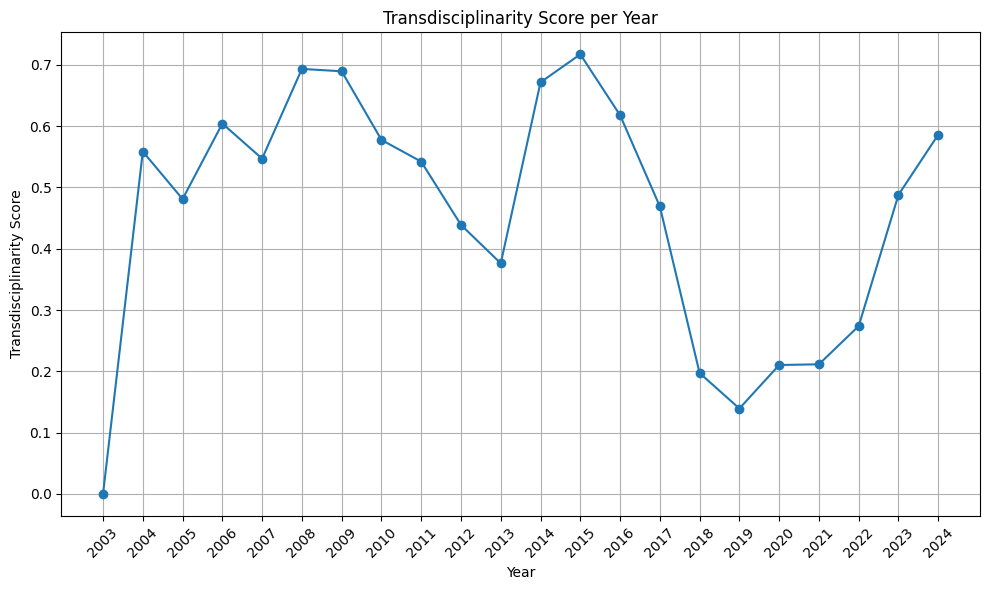

In [36]:
# Visualize Results

# Convert the 'Year' column to string type
transdisciplinarity_scores_df['Year'] = transdisciplinarity_scores_df['Year'].astype(str)

# Sort the DataFrame by the 'Year' column in ascending order
transdisciplinarity_scores_df = transdisciplinarity_scores_df.sort_values(by='Year')

# Filter out rows with 'nan' values in the 'Year' column
transdisciplinarity_scores_df = transdisciplinarity_scores_df[transdisciplinarity_scores_df['Year'] != 'nan']

plt.figure(figsize=(10, 6))  # Set the figure size
plt.plot(transdisciplinarity_scores_df['Year'], transdisciplinarity_scores_df['Transdisciplinarity Score'], marker='o')
plt.xlabel('Year')
plt.ylabel('Transdisciplinarity Score')
plt.title('Transdisciplinarity Score per Year')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Diversity KPI

The diversity KPI provides insights regarding the nationality representation across years at Constructor University.

The university is strongly characterized by the high number of different nationalities represented in the student body. Nonetheless, it is important confirming such information through data, to understand whether all nationalities are represented.


In [18]:
# Diversity KPI Exploration

# Group the data by year and school, and count the occurrences
nationality_counts_per_year = df_cleaned.groupby(['Year', 'Nationality']).size().reset_index(name='count')

# Print the counts per year of each school
print(nationality_counts_per_year)

      Year                   Nationality  count
0     2003                       Germany      1
1     2003                        Poland      1
2     2004                       Belarus      1
3     2004            Bosnia Herzegovina      1
4     2004                      Bulgaria     10
5     2004                        Canada      1
6     2004                       Ecuador      1
7     2004                   El Salvador      1
8     2004                       Estonia      1
9     2004                       Germany     34
10    2004                         Ghana      3
11    2004                     Hong Kong      1
12    2004                       Hungary      1
13    2004                         India      6
14    2004                         Italy      1
15    2004                       Jamaica      1
16    2004                    Kazakhstan      1
17    2004                         Kenya      1
18    2004                    Kyrgyzstan      1
19    2004                        Latvia

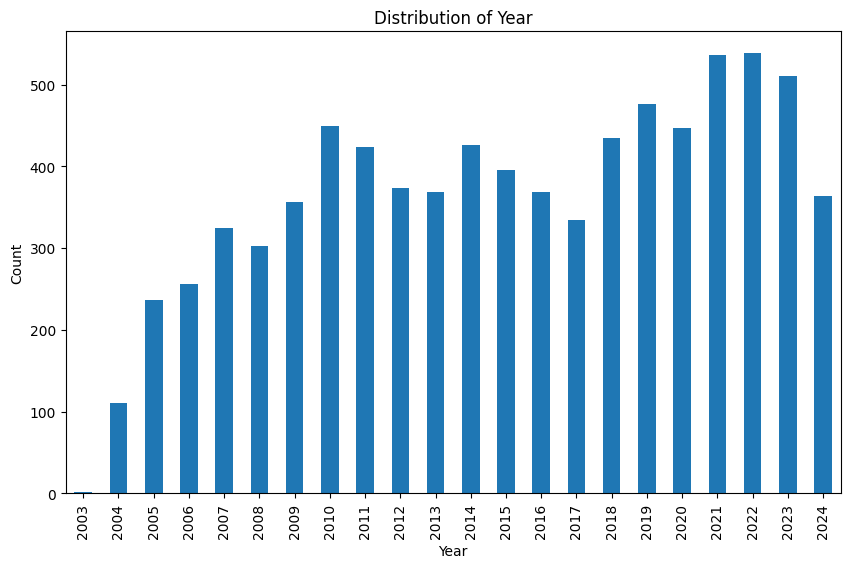

In [19]:
# Visualize count of students per year according to nationality

# Plot the distribution of the "Nationality" column
#plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
#df_cleaned['Nationality'].value_counts().plot(kind='bar')
#plt.title('Distribution of Nationality')
#plt.xlabel('Nationality')
#plt.ylabel('Count')
#plt.show()

# Plot the distribution of the "year" column
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
df_cleaned['Year'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

<ipython-input-20-f06c641bc0ac>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


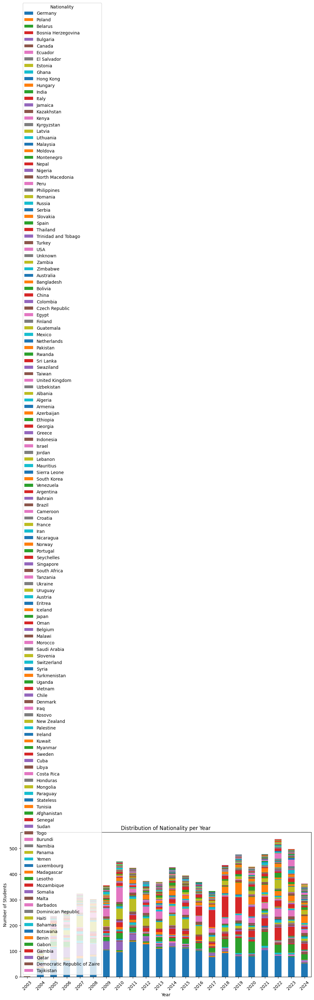

In [20]:
# Plotting distribution of nationalities across years in a stacked graph.
# Germany is predominately the country with more representation. This trend has been decreasing the last 3 years.

# Group the DataFrame by "Year" and "Nationality" columns and get the count
nationality_counts_per_year = df_cleaned.groupby(['Year', 'Nationality']).size().unstack()

# Plot the distributions as a stacked bar graph
nationality_counts_per_year.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.title('Distribution of Nationality per Year')
plt.legend(title='Nationality')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Diversity Score**

To understand the diversity of nationalities in the data set, we calculate the diversity score. The calculation is a bit different than the transdisciplinarity score as the goal of the diversity score is to understand a larger set of categories and their level of representation.

Hence, we will implement two widely known KPIs for assessing the diversity of a data set:

1. The Gini-Simpson Index
2. Nationality Evenness

We first compute the **The Gini-Simpson Index**, since it measures the diversity in a dataset (per year), in this case, the diversity of nationalities among alumni in different years. It ranges between 0 and 1, where 0 indicates perfect diversity (all nationalities are equally distributed) and 1 indicates no diversity (only one nationality is present).

**Formula: Gini-Simpson Index = 1 - ∑(P^2)**

Where P is the proportion of each nationality in the dataset.


In [38]:
# Group the data by year
grouped = df_cleaned.groupby('Year')

# Initialize an empty list to store the Gini-Simpson indices
gini_simpson_indices = []

# Iterate over each group (year) and calculate the Gini-Simpson Index
for year, group_data in grouped:
    total_count = len(group_data)
    nationality_counts = group_data['Nationality'].value_counts()

    # Calculate the proportion of each nationality
    proportions = nationality_counts / total_count

    # Calculate the Gini-Simpson Index
    gini_simpson_index = 1 - np.sum(proportions ** 2)

    # Append the year and Gini-Simpson Index to the list
    gini_simpson_indices.append((year, gini_simpson_index))

# Create a DataFrame for the Gini-Simpson Indices
gini_simpson_df = pd.DataFrame(gini_simpson_indices, columns=['Year', 'Gini-Simpson Index'])

# Print the Gini-Simpson Indices
print(gini_simpson_df)




    Year  Gini-Simpson Index
0   2003            0.500000
1   2004            0.879880
2   2005            0.879863
3   2006            0.899261
4   2007            0.895767
5   2008            0.887439
6   2009            0.888544
7   2010            0.915978
8   2011            0.871985
9   2012            0.863098
10  2013            0.892987
11  2014            0.903877
12  2015            0.898484
13  2016            0.896380
14  2017            0.895461
15  2018            0.902576
16  2019            0.923090
17  2020            0.938426
18  2021            0.939421
19  2022            0.948736
20  2023            0.953818
21  2024            0.955463


Interpreting the results:
*   In 2003, the Gini-Simpson Index is 0.5, which suggests moderate diversity in terms of nationalities among alumni.
* In the following years, the index seems to fluctuate between around 0.87 and 0.95. These values suggest that there is a relatively high level of diversity in the nationalities among alumni, but it's not perfectly evenly distributed.
* The index gradually increases over the years. This might indicate that there's a trend of increasing diversity among alumni in terms of nationalities.
The highest value in the list is 0.955 (in 2024), which indicates that the diversity of nationalities among alumni is very close to being evenly distributed.
*   Overall, the trend seems to suggest that the diversity of nationalities among alumni is gradually increasing, and in recent years, it has reached a point where it's approaching a very balanced distribution. This information could be valuable for understanding how the university's demographics have been evolving in terms of international representation.









Now that we have an understanding of the level of representation of nationalities, we need to learn whether there is nationality evenness. This KPI is used as a complement to the Gini-Simpson Index.

**Nationality Evenness:**
This measures the evenness of representation across different nationalities. It's the complement of the Gini-Simpson index.

**Formula: Evenness = 1 - Gini-Simpson Index**

This code will calculate the nationality evenness using the complement of the Gini-Simpson Index and store the results in a DataFrame named evenness_df. The evenness values will also range from 0 to 1, where 0 represents minimum evenness (maximum diversity) and 1 represents maximum evenness (even distribution of nationalities).



In [39]:
# Assuming your dataset is named 'df_cleaned'
# Group the data by year and nationality, and count the occurrences
nationality_counts_per_year = df_cleaned.groupby(['Year', 'Nationality']).size().unstack(fill_value=0)

# Calculate the proportion of each nationality in each year
proportions = nationality_counts_per_year.div(nationality_counts_per_year.sum(axis=1), axis=0)

# Calculate the Gini-Simpson Index for each year
gini_simpson_index = 1 - (proportions ** 2).sum(axis=1)

# Calculate the nationality evenness using the complement of Gini-Simpson Index
nationality_evenness = 1 - gini_simpson_index

# Create a DataFrame for the nationality evenness
evenness_df = pd.DataFrame({'Year': gini_simpson_index.index, 'Nationality Evenness': nationality_evenness.values})

# Print the nationality evenness
print(evenness_df)

#The evenness values will also range from 0 to 1,
#where 0 represents minimum evenness (maximum diversity)
#and 1 represents maximum evenness (even distribution of nationalities).


    Year  Nationality Evenness
0   2003              0.500000
1   2004              0.122314
2   2005              0.121158
3   2006              0.100739
4   2007              0.104233
5   2008              0.112561
6   2009              0.112716
7   2010              0.084022
8   2011              0.128015
9   2012              0.136902
10  2013              0.107013
11  2014              0.096123
12  2015              0.101516
13  2016              0.103620
14  2017              0.104539
15  2018              0.097424
16  2019              0.076910
17  2020              0.066849
18  2021              0.076172
19  2022              0.051647
20  2023              0.048820
21  2024              0.044783


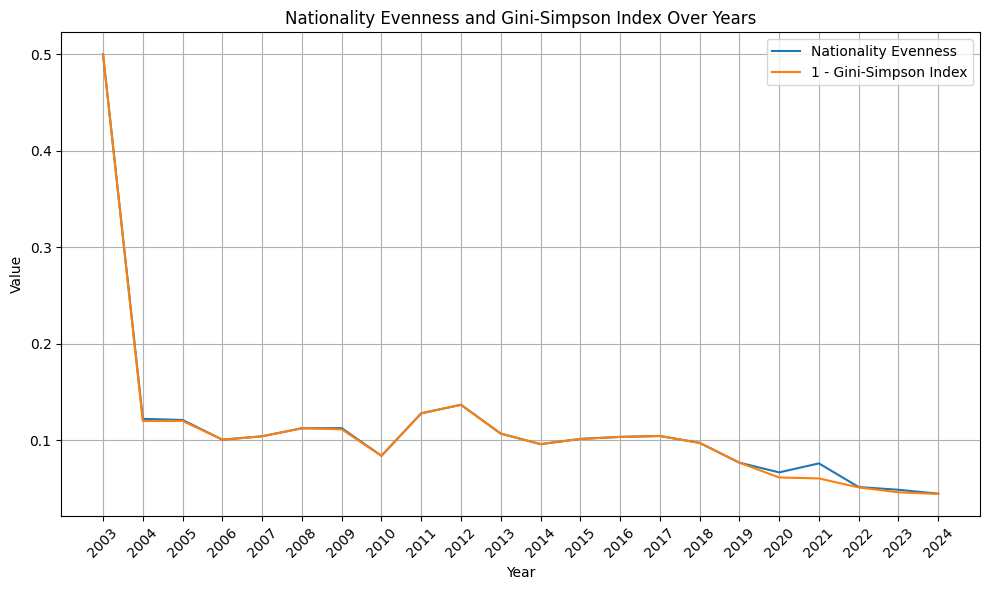

In [44]:
import matplotlib.pyplot as plt

# Assuming you have "evenness_df" and "gini_simpson_df" with columns "Year" and "Evenness" or "Gini-Simpson Index"

# Extracting data from DataFrames
years = evenness_df['Year']
nationality_evenness = evenness_df['Nationality Evenness']
gini_simpson = [1 - score for score in gini_simpson_df['Gini-Simpson Index']]

# Create a line graph
plt.figure(figsize=(10, 6))
plt.plot(years, nationality_evenness, label='Nationality Evenness')
plt.plot(years, gini_simpson, label='1 - Gini-Simpson Index')
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Nationality Evenness and Gini-Simpson Index Over Years')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()




From the provided Gini-Simpson Index and Nationality Evenness values over the years, we can make the following observations:

**Gini-Simpson Index Trends:**

1. The Gini-Simpson Index values range from 0.5 to around 0.95 over the years.
2. The Gini-Simpson Index measures the diversity within a category (in this case, nationalities). Higher values indicate higher inequality, where a few nationalities dominate the population.
3. The values show an increasing trend, suggesting that the distribution of nationalities is becoming less even over time.
4. The increase is not consistent; there are fluctuations, but the general trend is upward.

**Nationality Evenness Trends:**
1. The Nationality Evenness values range from around 0.04 to 0.5 over the years.
2. Nationality Evenness is a measure of how evenly the population is distributed among different nationalities. Higher values indicate a more even distribution.
3. The values show a decreasing trend, indicating that the distribution of students among different nationalities is becoming less even over time.
Similar to the Gini-Simpson Index, there are fluctuations, but the general trend is downward.


**Overall Conclusions:**

1. Both the Gini-Simpson Index and Nationality Evenness suggest that the distribution of students among different nationalities is becoming less even over the years.
2. This could indicate changing trends in international student enrollment or preferences in the university.
3. While Gini-Simpson Index focuses on inequality within nationalities, Nationality Evenness focuses on overall distribution equality.

In [42]:
 # Proportions
proportion_female_university = 0.44
proportion_male_university = 0.56
proportion_female_stem = 0.391
proportion_male_stem = 0.609

# Calculate KPIs
gender_ratio_stem = proportion_female_stem / proportion_male_stem
gender_diversity_index_stem = 1 - abs(proportion_female_stem - proportion_male_stem)
gender_parity_index_stem = (proportion_female_stem / proportion_female_university) / (proportion_male_stem / proportion_male_university)
gender_representation_gap = proportion_female_stem - proportion_female_university
inclusion_ratio = proportion_female_stem / proportion_male_stem

# Print KPIs
print("Gender Ratio in STEM Programs:", gender_ratio_stem)
print("Gender Diversity Index in STEM Programs:", gender_diversity_index_stem)
print("Gender Parity Index in STEM Programs:", gender_parity_index_stem)
print("Gender Representation Gap:", gender_representation_gap)
print("Inclusion Ratio:", inclusion_ratio)


Gender Ratio in STEM Programs: 0.6420361247947455
Gender Diversity Index in STEM Programs: 0.782
Gender Parity Index in STEM Programs: 0.8171368861024034
Gender Representation Gap: -0.04899999999999999
Inclusion Ratio: 0.6420361247947455


In [21]:
# Diversity Score

# Get the unique years in the dataset - CORRECT
years2 = df_cleaned['Year'].unique()

# Initialize an empty list to store the scores
scores2 = []

# Iterate over each year and calculate the diversity score
for year in years:
    # Filter the data for the specific year
    year_data2 = df_cleaned[df_cleaned['Year'] == year]

    # Get the observed distribution for the nationality in the specific year
    observed_distribution2 = year_data2['Nationality'].value_counts(normalize=True)

    # Get the number of unique nationalities
    n = len(observed_distribution2)

    # Check if n is 0 and assign a minimum value of 1
    if n == 0:
        n = 1

    # Calculate the diversity score for the specific year
    score = ((n - 1) / n) * sum(abs(observed_distribution2 - (1 / n)))

    # Append the year and score to the list
    scores.append((year, score))


# Create a DataFrame for the transdisciplinarity scores
diversity_scores_df = pd.DataFrame(scores, columns=['Year', 'Nationality Score'])

# Sort the DataFrame by the 'Year' column in ascending order
diversity_scores_df = diversity_scores_df.sort_values(by='Year')

# Print the transdisciplinarity scores table
print(diversity_scores_df)



#sub-ends n school sum might be higher than n.


    Year  Nationality Score
22  2003           0.000000
45  2003           0.000000
44  2004           0.939545
21  2004           0.372372
31  2005           1.048487
8   2005           0.320675
37  2006           1.050104
14  2006           0.402778
39  2007           1.159285
16  2007           0.364637
38  2008           1.112012
15  2008           0.462222
26  2009           1.055016
3   2009           0.459639
5   2010           0.385049
28  2010           1.062809
43  2011           1.092223
20  2011           0.361381
4   2012           0.292593
27  2012           1.092469
17  2013           0.250776
40  2013           0.971225
10  2014           0.447665
33  2014           1.056692
41  2015           1.047015
18  2015           0.478097
2   2016           0.411894
25  2016           1.152286
6   2017           0.312653
29  2017           1.098863
42  2018           1.170592
19  2018           0.131455
35  2019           1.095822
12  2019           0.092869
32  2020           1

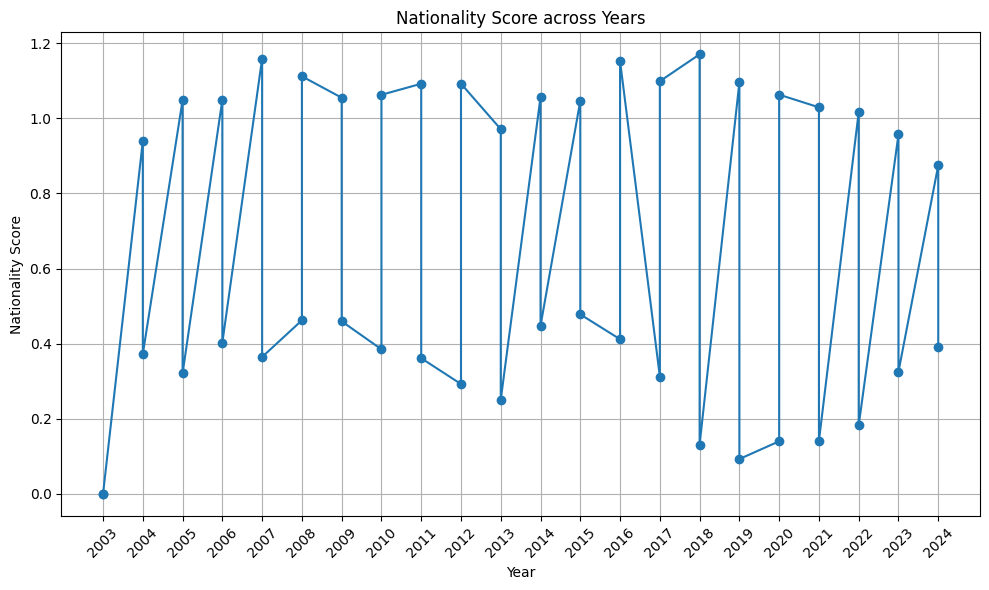

In [41]:
# Diversity Score

# Convert the 'Year' column to string type
diversity_scores_df['Year'] = diversity_scores_df['Year'].astype(str)

# Sort the DataFrame by the 'Year' column in ascending order
diversity_scores_df = diversity_scores_df.sort_values(by='Year')

# Filter out rows with 'nan' values in the 'Year' column
diversity_scores_df = diversity_scores_df[diversity_scores_df['Year'] != 'nan']

# Plot the nationality scores across years
plt.figure(figsize=(10, 6))  # Set the figure size
plt.plot(diversity_scores_df['Year'], diversity_scores_df['Nationality Score'], marker='o')
plt.xlabel('Year')
plt.ylabel('Nationality Score')
plt.title('Nationality Score across Years')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
#test, it worked!

# Filter the data for the specific year
year_data = df[df['Year'] == 5]

# Get the observed distribution for the schools in the specific year
observed_distribution = year_data['School'].value_counts(normalize=True)

# Get the number of unique schools/categories
n = len(observed_distribution)

# Calculate the transdisciplinarity score for the specific year
score = ((n - 1) / n) * sum(abs(observed_distribution - (1 / n)))

# Print the transdisciplinarity score for the specific year
print("Transdisciplinarity Score for Year 5:", score)

ZeroDivisionError: ignored

In [23]:
# Filter out the unwanted values from the Year column
filtered_scores_df2 = scores_df2[~scores_df2['Year'].isin(['NaN','604','NaN','EX', 'Fall 20', 'Spring 17', 'Fall 19', 'Fall 18',
                                                       'Exchange/Visiting Program', 'Fall 17', 'Fall 10', 'II',
                                                       'Spring 21', '604', 'I'])]

# Print the filtered scores DataFrame
print(filtered_scores_df2)

NameError: ignored

In [ ]:
#Measure transdisciplinarity over time

#



#Visualize relationship between year and program





#Check distribution

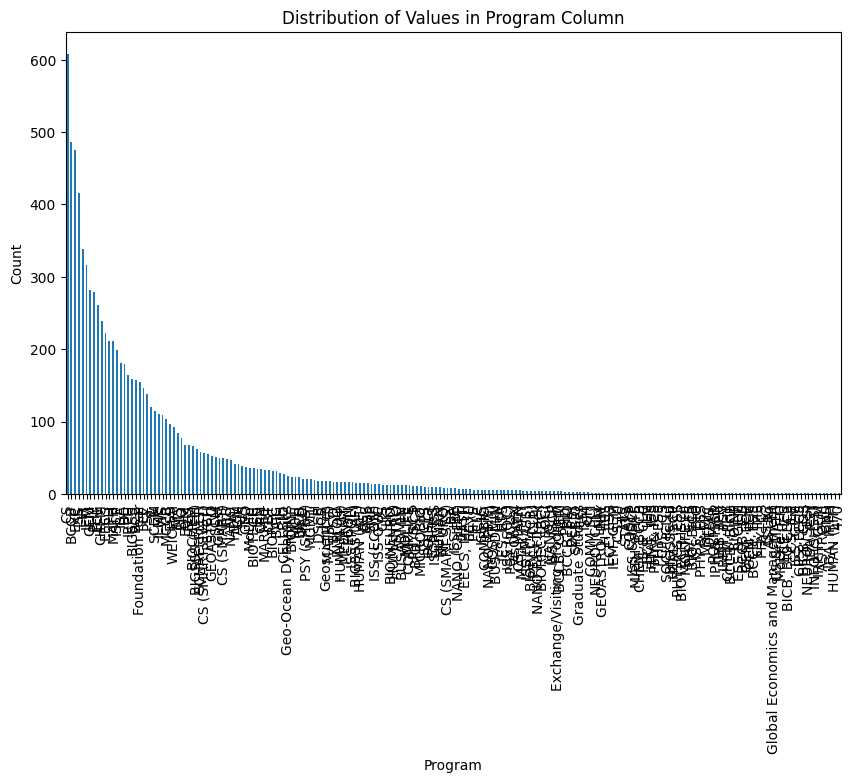

In [ ]:
import matplotlib.pyplot as plt

# Plot the distribution of values in the "program" column
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
df['Program'].value_counts().plot(kind='bar')
plt.title('Distribution of Values in Program Column')
plt.xlabel('Program')
plt.ylabel('Count')
plt.show()

In [ ]:
# Diversity is defined as distribution of "countries"
# Check distribution

NameError: ignored

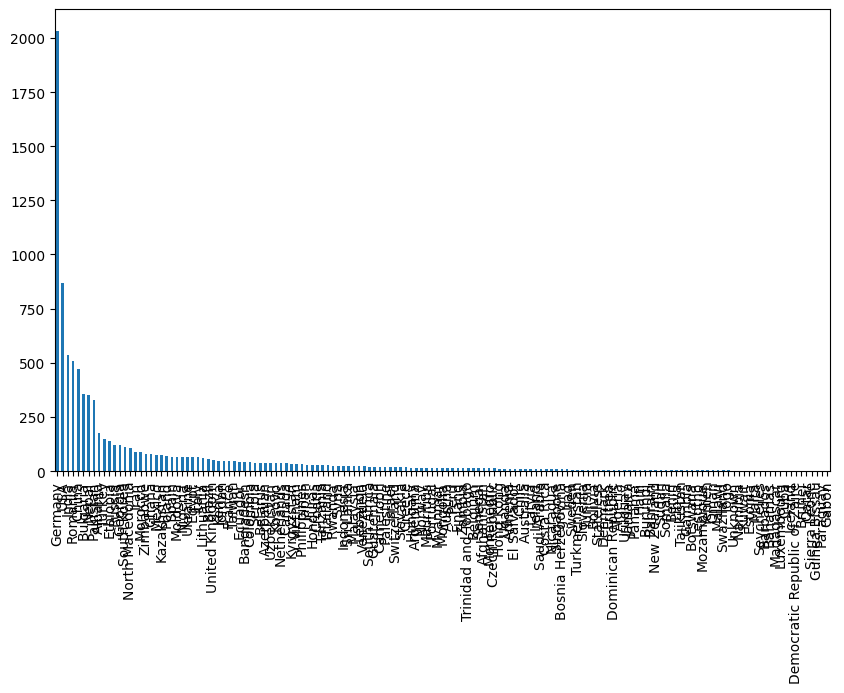

In [ ]:
# Distribution of values in the "Nationality" column
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
df['Nationality'].value_counts().plot(kind='bar')
plt.title('Distribution of Values in Program Column')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.show()


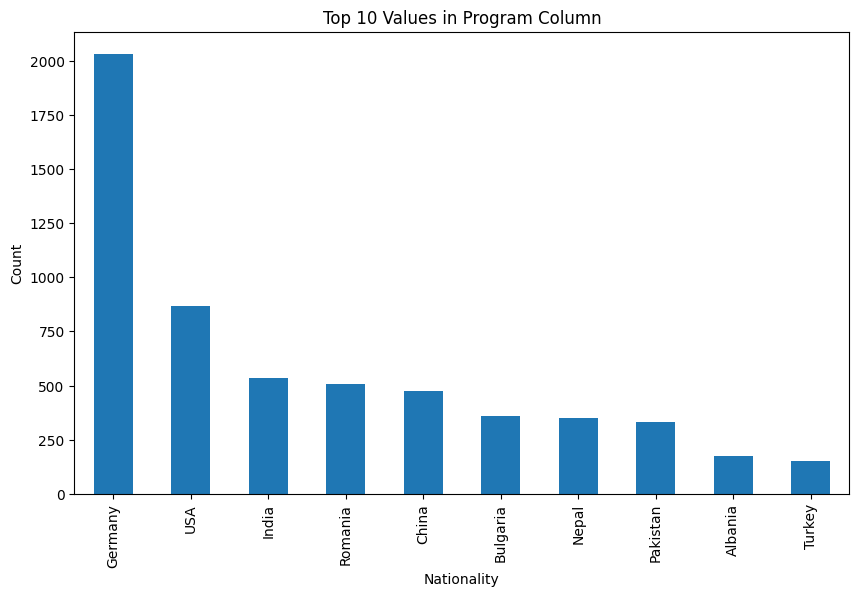

In [ ]:
# Get the top 10 values and their counts in the "Nationality" column
top_10_values = df['Nationality'].value_counts().head(10)

# Plot the distribution of top 10 values in the "program" column
plt.figure(figsize=(10, 6))  # Adjust the figure size
top_10_values.plot(kind='bar')
plt.title('Top 10 Values in Program Column')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.show()

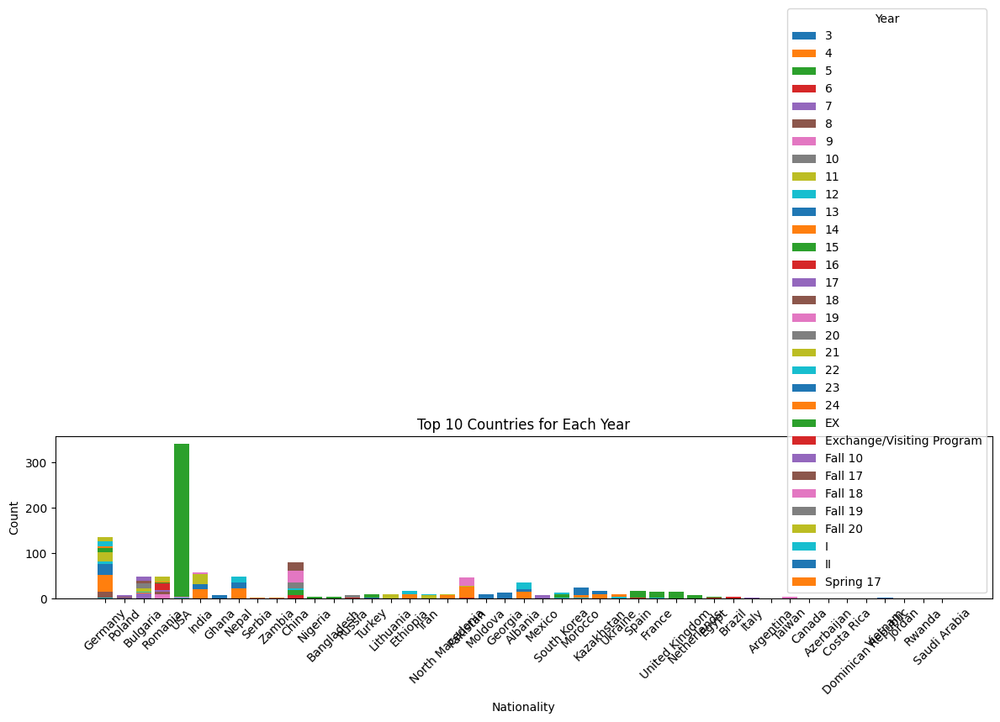

In [ ]:
# Group the data by year and nationality, and count the occurrences
grouped_data = df.groupby(['Year', 'Nationality']).size().reset_index(name='count')

# Get the top 10 countries for each year
top_10_countries_per_year = grouped_data.groupby('Year').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

# Plot the top 10 countries for each year
plt.figure(figsize=(12, 6))  # Adjust the figure size
for Year, data in top_10_countries_per_year.groupby('Year'):
    plt.bar(data['Nationality'], data['count'], label=Year)

plt.title('Top 10 Countries for Each Year')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.legend(title='Year')
plt.tight_layout()
plt.show()


In [16]:
#previous CORRECT VERSION - no longer correct as
# Get the unique years in the dataset - CORRECT
years = df_cleaned['Year'].unique()

# Initialize an empty list to store the scores
scores = []

# Iterate over each year and calculate the transdisciplinarity score
for year in years:
    # Filter the data for the specific year
    year_data = df_cleaned[df_cleaned['Year'] == year]

    # Get the observed distribution for the schools in the specific year
    observed_distribution = year_data['School'].value_counts(normalize=True)

    # Get the number of unique schools/categories
    n = len(observed_distribution)


#check whether I am getting 1 when expected in perfect distribution.
#create artificial year and test "edge cases" year X 300 students graduated,
#exactly a 1/3 of business, 1/3 of soc, and 1/3 of biz - we should expect to have 1.
#If we do not have 1 then it is incorrect.
# focus on score calculation for a year.
#Create function with input 1: n and the second: distribution (n - soc, n-stem, n-biz, sum of this equals n,
#it must be the sum of these three, derive the n by writing n =sum(observed distribution))
    # Check if n is 0 and assign a minimum value of 1
    if n == 0:
        n = 1

    # Calculate the transdisciplinarity score for the specific year
    score = ((n - 1) / n) * sum(abs(observed_distribution - (1 / n)))

    # Append the year and score to the list
    scores.append((year, score))


# Create a DataFrame for the transdisciplinarity scores
transdisciplinarity_scores_df = pd.DataFrame(scores, columns=['Year', 'Transdisciplinarity Score'])

# Sort the DataFrame by the 'Year' column in ascending order
transdisciplinarity_scores_df = transdisciplinarity_scores_df.sort_values(by='Year')

# Print the transdisciplinarity scores table
print(transdisciplinarity_scores_df)

    Year  Transdisciplinarity Score
22  2003                   0.000000
21  2004                   0.372372
8   2005                   0.320675
14  2006                   0.402778
16  2007                   0.364637
15  2008                   0.462222
3   2009                   0.459639
5   2010                   0.385049
20  2011                   0.361381
4   2012                   0.292593
17  2013                   0.250776
10  2014                   0.447665
18  2015                   0.478097
2   2016                   0.411894
6   2017                   0.312653
19  2018                   0.131455
12  2019                   0.092869
9   2020                   0.140194
13  2021                   0.140962
11  2022                   0.182569
7   2023                   0.325288
1   2024                   0.390720
0    NaN                   0.000000


In [15]:

# Transdisciplinarity score per year
#Pi chart Percentages of students per school - others
# stacked bar chart

# High transdisciplinarity score is high when each of these - captures the distance of the current distribution from a perfect distribution
#Ideal Distribution
social 1/3
business 1/3
stem 1/3

observed distribution
stem 30
social 10
biz 60

stem 30 the difference between the current ratio vs. the ideal distribution


#score calculation = absolute value of observed vs. ideal


# = 0,30 - (0,33) = (absolute value 0.03)



SyntaxError: ignored